For this project, I will be analyzing some 911 call data from [Kaggle](https://www.kaggle.com/mchirico/montcoalert).

## Data and Setup

In [2]:
import numpy as np
import pandas as pd

In [3]:
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
%matplotlib inline

In [4]:
df = pd.read_csv('911.csv')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99492 entries, 0 to 99491
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   lat        99492 non-null  float64
 1   lng        99492 non-null  float64
 2   desc       99492 non-null  object 
 3   zip        86637 non-null  float64
 4   title      99492 non-null  object 
 5   timeStamp  99492 non-null  object 
 6   twp        99449 non-null  object 
 7   addr       98973 non-null  object 
 8   e          99492 non-null  int64  
dtypes: float64(3), int64(1), object(5)
memory usage: 6.8+ MB


In [6]:
df.head(3)

,lat,lng,desc,zip,title,timeStamp,twp,addr,e
0,40.297876,-75.581294,REINDEER CT & DEAD END; NEW HANOVER; Station ...,19525.0,EMS: BACK PAINS/INJURY,2015-12-10 17:40:00,NEW HANOVER,REINDEER CT & DEAD END,1
1,40.258061,-75.264680,BRIAR PATH & WHITEMARSH LN; HATFIELD TOWNSHIP...,19446.0,EMS: DIABETIC EMERGENCY,2015-12-10 17:40:00,HATFIELD TOWNSHIP,BRIAR PATH & WHITEMARSH LN,1
2,40.121182,-75.351975,HAWS AVE; NORRISTOWN; 2015-12-10 @ 14:39:21-St...,19401.0,Fire: GAS-ODOR/LEAK,2015-12-10 17:40:00,NORRISTOWN,HAWS AVE,1


## Basic Questions

**What are the top 5 zipcodes for 911 calls?**

In [7]:
top_zipcodes= df['zip'].value_counts().head(5)

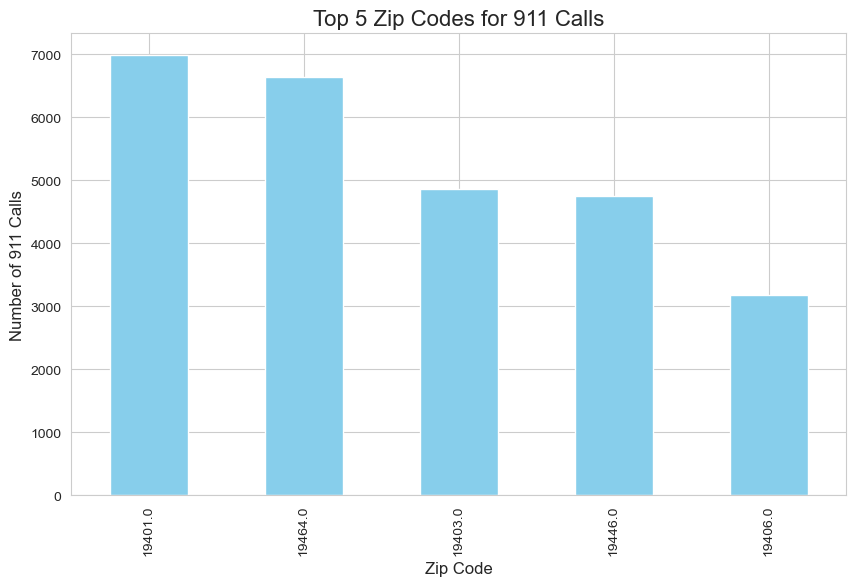

In [8]:
plt.figure(figsize=(10,6))
top_zipcodes.plot(kind='bar', color='skyblue')

plt.title('Top 5 Zip Codes for 911 Calls', fontsize=16)
plt.xlabel('Zip Code', fontsize=12)
plt.ylabel('Number of 911 Calls', fontsize=12)

# Show plot
plt.show()

** What are the top 5 townships (twp) for 911 calls? **

In [11]:
top_twp= df['twp'].value_counts().head(5)

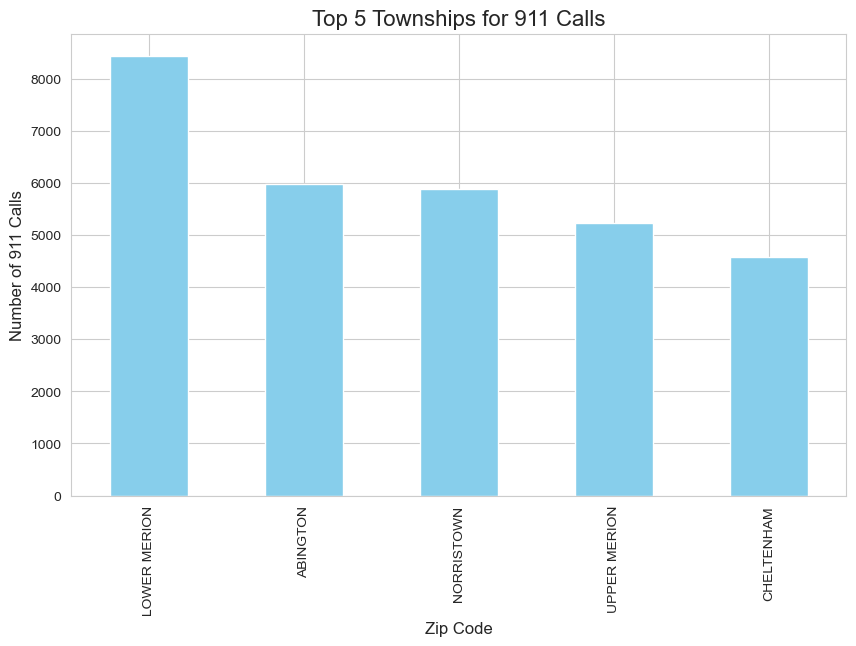

In [12]:
plt.figure(figsize=(10,6))
top_twp.plot(kind='bar', color='skyblue')

plt.title('Top 5 Townships for 911 Calls', fontsize=16)
plt.xlabel('Zip Code', fontsize=12)
plt.ylabel('Number of 911 Calls', fontsize=12)

plt.show()

## Creating new features

** In the titles column there are "Reasons/Departments" specified before the title code. These are EMS, Fire, and Traffic. We will be using .apply() with a custom lambda expression to create a new column called "Reason" that contains this string value.** 

**For example, if the title column value is EMS: BACK PAINS/INJURY , the Reason column value would be EMS. **

In [14]:
df['Reason'] = df['title'].apply(lambda title: title.split(':')[0])

** What is the most common Reason for a 911 call based off of this new column? **

In [15]:
df['Reason'].value_counts()

Reason
EMS        48877
Traffic    35695
Fire       14920
Name: count, dtype: int64

** Now use seaborn to create a countplot of 911 calls by Reason. **

<Axes: xlabel='Reason', ylabel='count'>

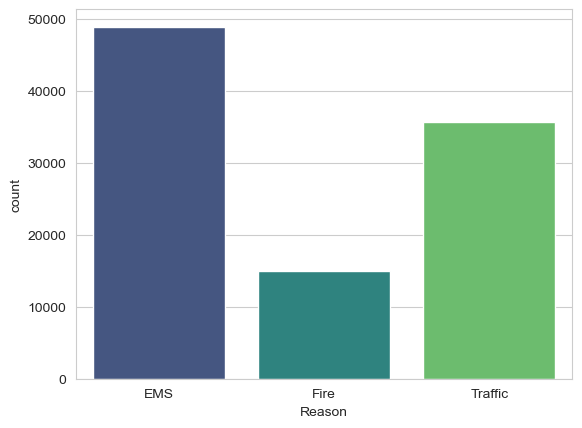

In [16]:
sns.countplot(x='Reason',data=df,palette='viridis')

___
** Now let us begin to focus on time information. What is the data type of the objects in the timeStamp column? **

In [8]:
type(df['timeStamp'].iloc[0])

str

** We will use [pd.to_datetime] to convert the column from strings to DateTime objects. **

In [9]:
df['timeStamp'] = pd.to_datetime(df['timeStamp'])

In [10]:
df['Hour'] = df['timeStamp'].apply(lambda time: time.hour)
df['Month'] = df['timeStamp'].apply(lambda time: time.month)
df['Day of Week'] = df['timeStamp'].apply(lambda time: time.dayofweek)

In [11]:
dmap = {0:'Mon',1:'Tue',2:'Wed',3:'Thu',4:'Fri',5:'Sat',6:'Sun'}

In [12]:
df['Day of Week'] = df['Day of Week'].map(dmap)

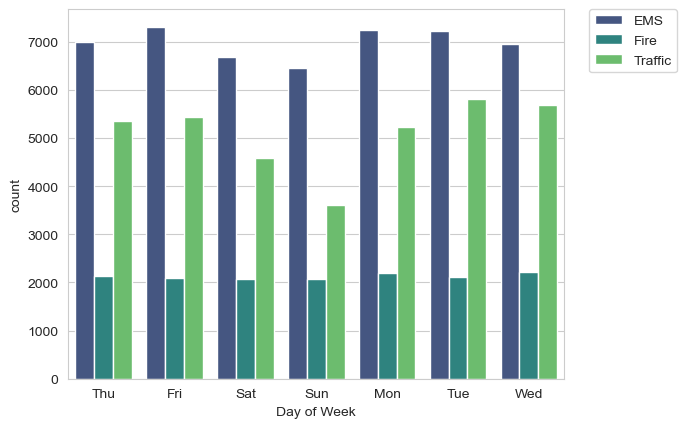

In [17]:
sns.countplot(x='Day of Week',data=df,hue='Reason',palette='viridis')

# To relocate the legend
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

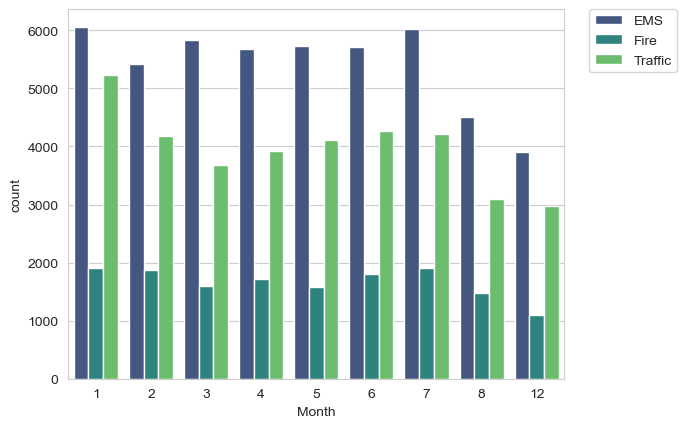

In [18]:
sns.countplot(x='Month',data=df,hue='Reason',palette='viridis')

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [19]:
byMonth = df.groupby('Month').count()
byMonth.head()

,lat,lng,desc,zip,title,timeStamp,twp,addr,e,Hour,Day of Week,Reason
Month,,,,,,,,,,,,
1,13205,13205,13205,11527,13205,13205,13203,13096,13205,13205,13205,13205
2,11467,11467,11467,9930,11467,11467,11465,11396,11467,11467,11467,11467
3,11101,11101,11101,9755,11101,11101,11092,11059,11101,11101,11101,11101
4,11326,11326,11326,9895,11326,11326,11323,11283,11326,11326,11326,11326
5,11423,11423,11423,9946,11423,11423,11420,11378,11423,11423,11423,11423


** Now create a simple plot off of the dataframe indicating the count of calls per month. **

<Axes: xlabel='Month'>

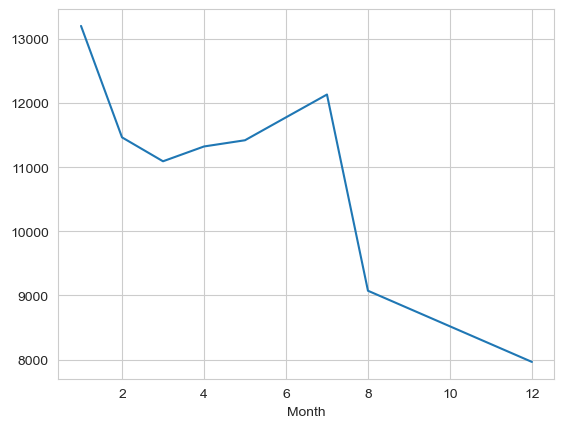

In [20]:
byMonth['twp'].plot()

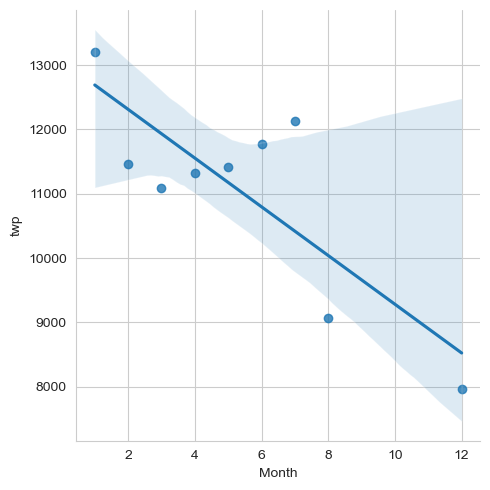

In [21]:
sns.lmplot(x='Month',y='twp',data=byMonth.reset_index())

In [22]:
df['Date']=df['timeStamp'].apply(lambda t: t.date())

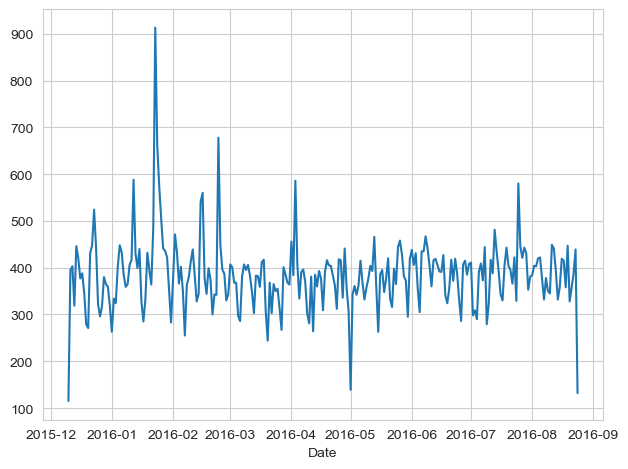

In [23]:
df.groupby('Date').count()['twp'].plot()
plt.tight_layout()

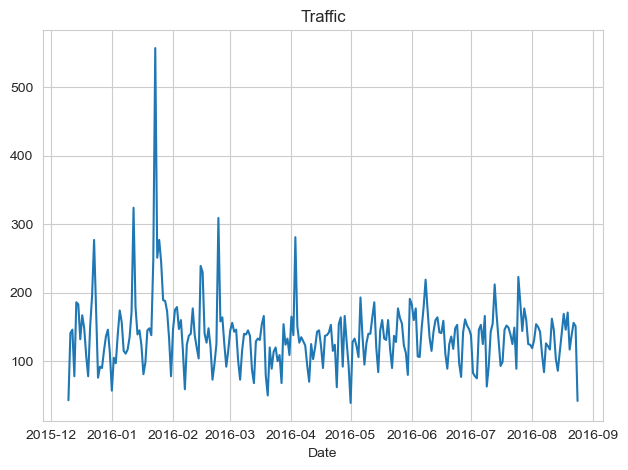

In [24]:
df[df['Reason']=='Traffic'].groupby('Date').count()['twp'].plot()
plt.title('Traffic')
plt.tight_layout()

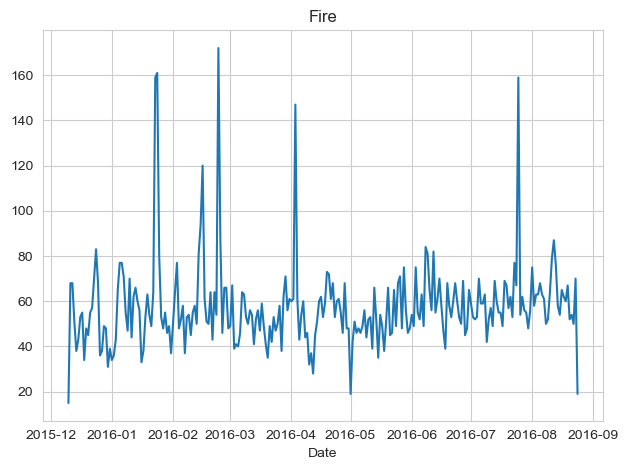

In [25]:
df[df['Reason']=='Fire'].groupby('Date').count()['twp'].plot()
plt.title('Fire')
plt.tight_layout()

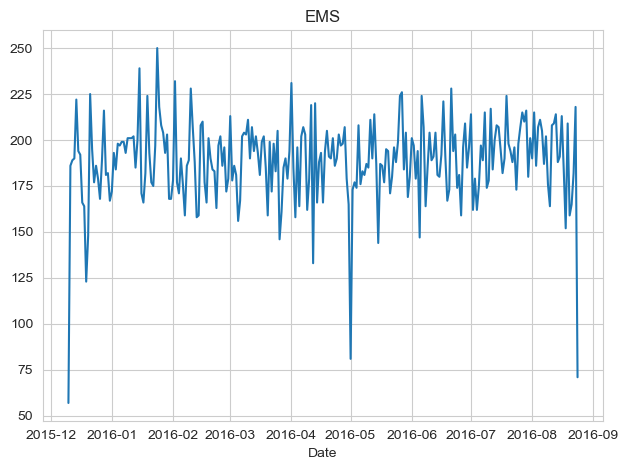

In [26]:
df[df['Reason']=='EMS'].groupby('Date').count()['twp'].plot()
plt.title('EMS')
plt.tight_layout()

In [27]:
dayHour = df.groupby(by=['Day of Week','Hour']).count()['Reason'].unstack()
dayHour.head()

Hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
Day of Week,,,,,,,,,,,,,,,,,,,,,
Fri,275,235,191,175,201,194,372,598,742,752,...,932,980,1039,980,820,696,667,559,514,474
Mon,282,221,201,194,204,267,397,653,819,786,...,869,913,989,997,885,746,613,497,472,325
Sat,375,301,263,260,224,231,257,391,459,640,...,789,796,848,757,778,696,628,572,506,467
Sun,383,306,286,268,242,240,300,402,483,620,...,684,691,663,714,670,655,537,461,415,330
Thu,278,202,233,159,182,203,362,570,777,828,...,876,969,935,1013,810,698,617,553,424,354


<Axes: xlabel='Hour', ylabel='Day of Week'>

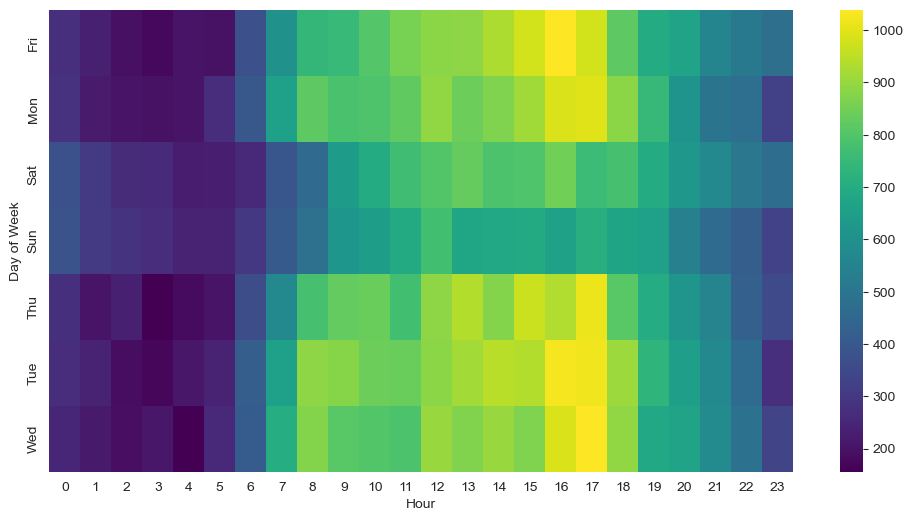

In [28]:
plt.figure(figsize=(12,6))
sns.heatmap(dayHour,cmap='viridis')

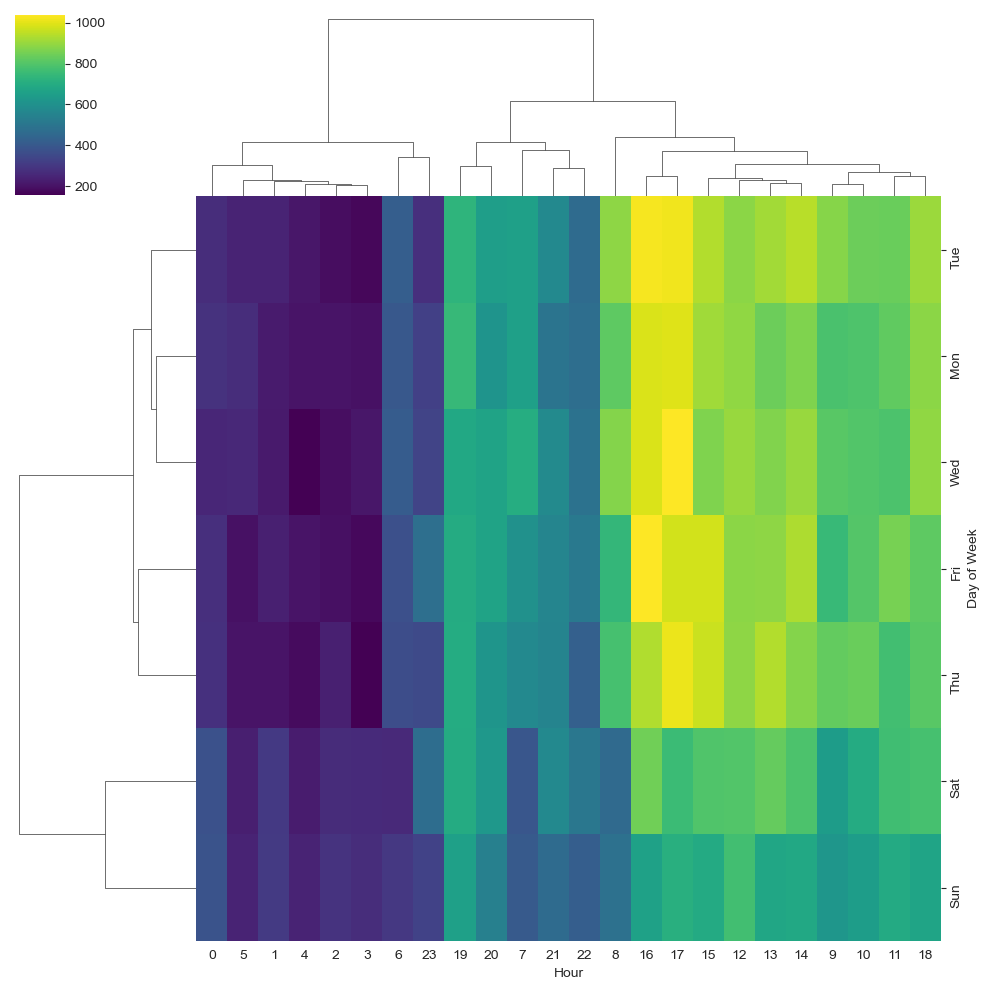

In [29]:
sns.clustermap(dayHour,cmap='viridis')

In [30]:
dayMonth = df.groupby(by=['Day of Week','Month']).count()['Reason'].unstack()
dayMonth.head()

Month,1,2,3,4,5,6,7,8,12
Day of Week,,,,,,,,,
Fri,1970,1581,1525,1958,1730,1649,2045,1310,1065
Mon,1727,1964,1535,1598,1779,1617,1692,1511,1257
Sat,2291,1441,1266,1734,1444,1388,1695,1099,978
Sun,1960,1229,1102,1488,1424,1333,1672,1021,907
Thu,1584,1596,1900,1601,1590,2065,1646,1230,1266


<Axes: xlabel='Month', ylabel='Day of Week'>

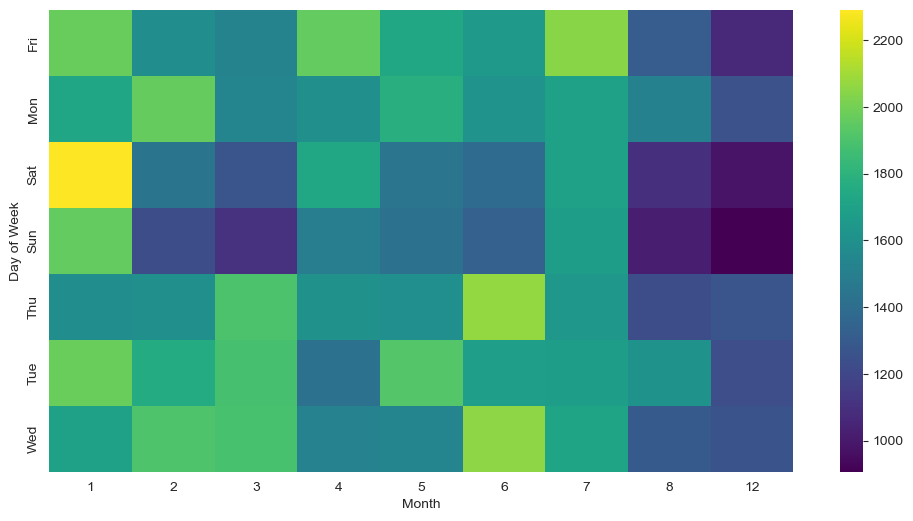

In [31]:
plt.figure(figsize=(12,6))
sns.heatmap(dayMonth,cmap='viridis')

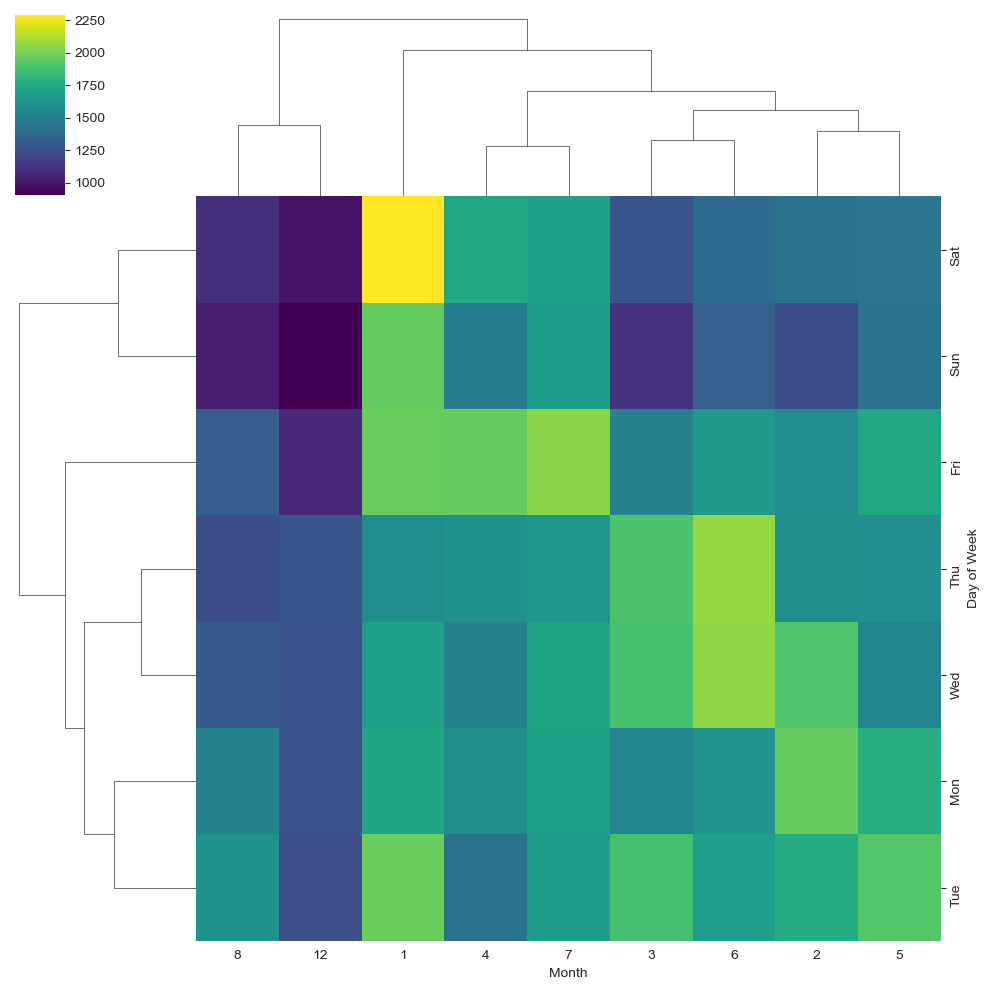

In [32]:
sns.clustermap(dayMonth,cmap='viridis')

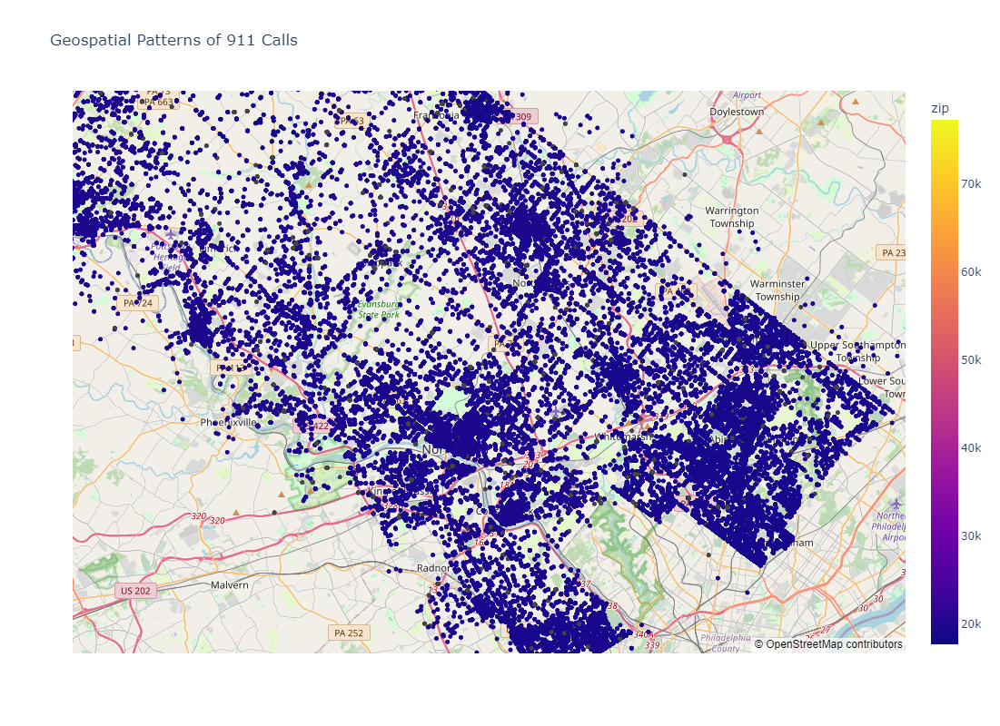

In [41]:
df = df.dropna(subset=['lat', 'lng'])

# Create a scatter map using Plotly Express
fig = px.scatter_mapbox(df, 
                        lat='lat', 
                        lon='lng', 
                        color='zip',  # You can use this to color-code by zip code
                        size_max=8, 
                        zoom=10, 
                        title="Geospatial Patterns of 911 Calls")

# Set the map style (you can change this to 'carto-positron', 'stamen-terrain', etc.)
fig.update_layout(mapbox_style="open-street-map",
                  width=1200,  
                  height=800)

# Display the plot
fig.show()

In [33]:
df.columns

Index(['lat', 'lng', 'desc', 'zip', 'title', 'timeStamp', 'twp', 'addr', 'e',
       'Hour', 'Month', 'Day of Week', 'Reason', 'Date'],
      dtype='object')

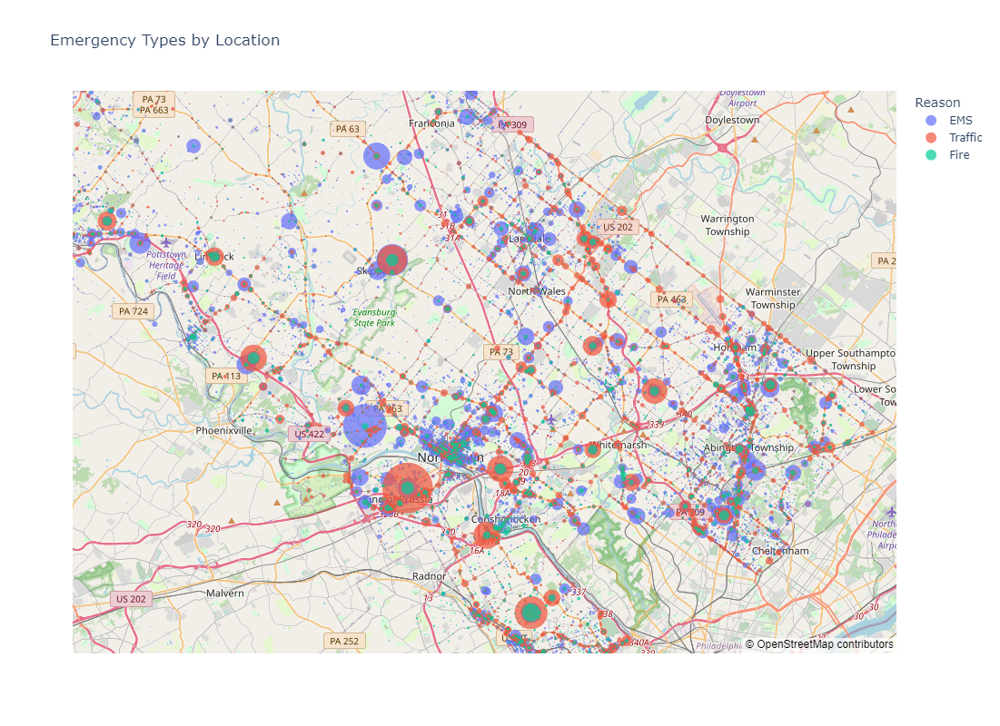

In [42]:
# Group data by emergency type and location, count occurrences
location_emergency_counts = df.groupby(['lat', 'lng', 'Reason']).size().reset_index(name='count')

# Create a scatter map to visualize emergency types by location
fig = px.scatter_mapbox(location_emergency_counts,
                        lat='lat',
                        lon='lng',
                        color='Reason',
                        size='count',
                        hover_name='Reason',
                        size_max=40,
                        zoom=10,
                        title="Emergency Types by Location")

fig.update_layout(mapbox_style="open-street-map",
                  width=1200,  
                  height=800)
fig.show()
